In [1]:
from scipy.spatial.transform import Rotation

from dust3r.inference import inference, load_model
from dust3r.image_pairs import make_pairs
from dust3r.utils.image import load_images, rgb
from dust3r.utils.device import to_numpy
from dust3r.viz import add_scene_cam, CAM_COLORS, OPENGL, pts3d_to_trimesh, cat_meshes
from dust3r.cloud_opt import global_aligner, GlobalAlignerMode
import cv2

import matplotlib.pyplot as plt
from dust3r.utils.geometry import find_reciprocal_matches, xy_grid

Warning, cannot find cuda-compiled version of RoPE2D, using a slow pytorch version instead


In [2]:
import torch
import numpy as np
import os

import torch.nn as nn
import torch.optim as optim

import plotly.graph_objects as go

In [3]:
def get_file_paths(folder_path):
    file_paths = []  # List to store file paths
    # Walk through all files and directories in the specified folder
    for root, dirs, files in os.walk(folder_path):
        for file in files:
            file_path = os.path.join(root, file)  # Create full file path
            file_paths.append(file_path)  # Add file path to list
    # Sort the list based on filenames
    file_paths.sort(key=lambda path: os.path.basename(path))
    return file_paths

In [4]:
device="cuda"
model_path = "checkpoints/DUSt3R_ViTLarge_BaseDecoder_512_dpt.pth"
model = load_model(model_path, device)

... loading model from checkpoints/DUSt3R_ViTLarge_BaseDecoder_512_dpt.pth
instantiating : AsymmetricCroCo3DStereo(enc_depth=24, dec_depth=12, enc_embed_dim=1024, dec_embed_dim=768, enc_num_heads=16, dec_num_heads=12, pos_embed='RoPE100', patch_embed_cls='PatchEmbedDust3R', img_size=(512, 512), head_type='dpt', output_mode='pts3d', depth_mode=('exp', -inf, inf), conf_mode=('exp', 1, inf), landscape_only=False)
<All keys matched successfully>


In [5]:
folder_path = 'imgs'
file_paths = get_file_paths(folder_path)#[:4]

In [6]:
#file_paths[:4]

In [7]:
images = load_images(file_paths, size=512)

>> Loading a list of 6 images
 - adding imgs/sixangs_1feature_0.jpg with resolution 640x480 --> 512x384
 - adding imgs/sixangs_1feature_1.jpg with resolution 640x480 --> 512x384
 - adding imgs/sixangs_1feature_2.jpg with resolution 640x480 --> 512x384
 - adding imgs/sixangs_1feature_3.jpg with resolution 640x480 --> 512x384
 - adding imgs/sixangs_1feature_4.jpg with resolution 640x480 --> 512x384
 - adding imgs/sixangs_1feature_5.jpg with resolution 640x480 --> 512x384
 (Found 6 images)


In [8]:
schedule = 'cosine'
lr = 0.001
niter = 10000
batch_size = 10

In [9]:
pairs = make_pairs(images, scene_graph='complete', prefilter=None, symmetrize=True)
output = inference(pairs, model, device, batch_size=batch_size)

>> Inference with model on 30 image pairs


100%|█████████████████████████████████████████████| 3/3 [00:06<00:00,  2.26s/it]


In [10]:
scene = global_aligner(output, device=device, mode=GlobalAlignerMode.PointCloudOptimizer)
loss = scene.compute_global_alignment(init="mst", niter=niter, schedule=schedule, lr=lr)

 init edge (1*,3*) score=10.772890090942383
 init edge (1,2*) score=10.73431396484375
 init edge (1,0*) score=8.353658676147461
 init edge (2,4*) score=7.179837226867676
 init edge (3,5*) score=5.943098545074463
 init loss = 0.004562608432024717


 57%|███▍  | 5655/10000 [03:46<02:53, 25.01it/s, lr=0.000398593 loss=0.00155633]


KeyboardInterrupt: 

In [11]:
imgs = scene.imgs
focals = scene.get_focals()
poses = scene.get_im_poses()
pts3d = scene.get_pts3d()
confidence_masks = scene.get_masks()

In [12]:
focals

tensor([[560.9219],
        [591.5728],
        [583.5319],
        [588.9500],
        [576.9750],
        [628.7062]], device='cuda:0', grad_fn=<ExpBackward0>)

In [13]:
pts3d[1].reshape((-1,3))

tensor([[-0.2535, -0.1981,  0.5916],
        [-0.2603, -0.2042,  0.6101],
        [-0.2678, -0.2109,  0.6301],
        ...,
        [ 0.0540,  0.0401,  0.1260],
        [ 0.0552,  0.0408,  0.1284],
        [ 0.0571,  0.0421,  0.1324]], device='cuda:0',
       grad_fn=<ReshapeAliasBackward0>)

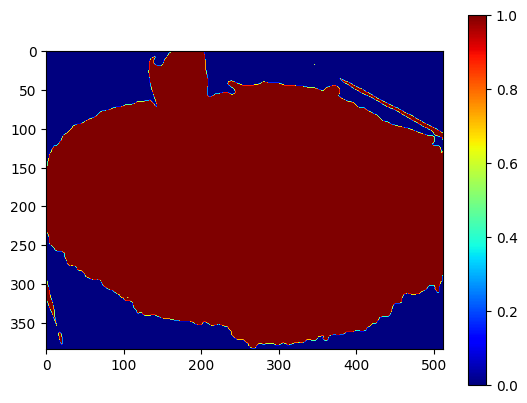

In [14]:
plt.imshow(confidence_masks[2].detach().cpu(),cmap="jet")
plt.colorbar()

In [15]:
pts_list=[]
for i in range(len(imgs)):
    sel_pts=pts3d[i][confidence_masks[i]]
    pts_list.append(sel_pts)

In [16]:
pts_tor=torch.cat(pts_list)

In [17]:
def extract_positions_directions(transform_matrices):
    positions = transform_matrices[:, :3, 3]
    forward_directions = transform_matrices[:, :3, 2]  # Negate if your camera looks along the -Z axis
    return positions, forward_directions

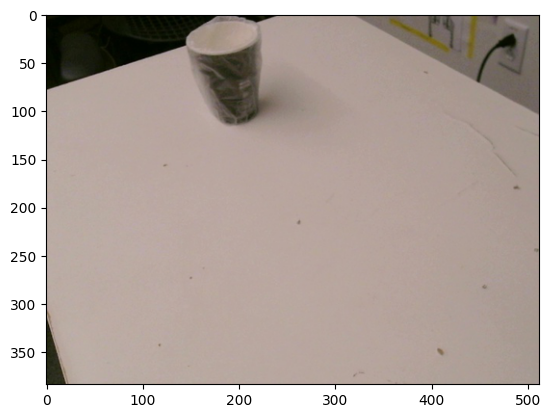

In [18]:
plt.imshow(imgs[3])

In [19]:
positions, directions = extract_positions_directions(poses)

In [20]:
positions=positions.detach().cpu()
directions=directions.detach().cpu()

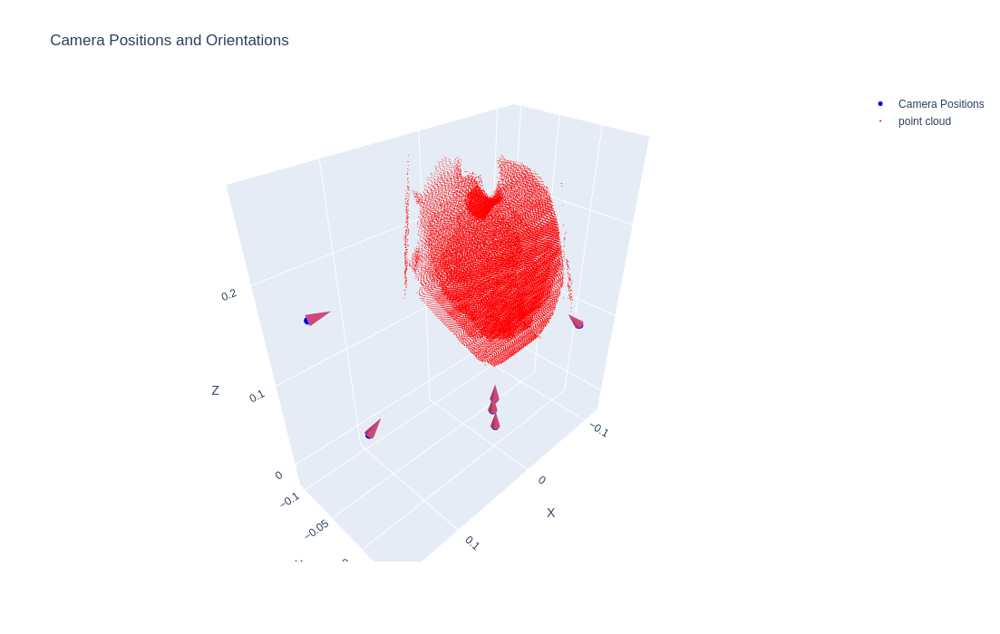

In [21]:
fig = go.Figure()

# Camera positions
fig.add_trace(go.Scatter3d(x=positions[:, 0], y=positions[:, 1], z=positions[:, 2],
                           mode='markers', marker=dict(size=5, color='blue'), name='Camera Positions'))

fig.add_trace(go.Scatter3d(x=pts_tor[::10, 0].detach().cpu(),  # X coordinates
    y=pts_tor[::10, 1].detach().cpu(),  # Y coordinates
    z=pts_tor[::10, 2].detach().cpu(),  # Z coordinates
                           mode='markers', marker=dict(size=0.5, color='red'),name="point cloud"))

# Directions
for position, direction in zip(positions, directions):
    fig.add_trace(go.Cone(x=[position[0]], y=[position[1]], z=[position[2]],
                          u=[direction[0]], v=[direction[1]], w=[direction[2]],
                          anchor="tail", showscale=False, sizeref=0.02))

fig.update_layout(scene=dict(xaxis_title='X', yaxis_title='Y', zaxis_title='Z'),
                  title="Camera Positions and Orientations")

fig.update_layout(width=1000, height=700)
fig.show()

In [22]:

def fit_line_and_align(points):
    """
    Fit a line through a batch of 3D points and align such that the fitted line is the x-axis.
    
    Parameters:
    - points (torch.Tensor): A tensor of shape (n, 3) representing n 3D points.
    
    Returns:
    - torch.Tensor: Transformed points aligned with the x-axis.
    - torch.Tensor: The rotation matrix used for alignment.
    """
    def rotation_matrix(axis, theta):
        """
        Create a rotation matrix for rotating theta radians around a given axis using Rodrigues' rotation formula.
        """
        axis = axis / torch.sqrt(torch.dot(axis, axis))
        a = torch.cos(theta / 2.0)
        b, c, d = -axis * torch.sin(theta / 2.0)
        aa, bb, cc, dd = a*a, b*b, c*c, d*d
        bc, ad, ac, ab, bd, cd = b*c, a*d, a*c, a*b, b*d, c*d
        return torch.tensor([[aa+bb-cc-dd, 2*(bc+ad), 2*(bd-ac)],
                             [2*(bc-ad), aa+cc-bb-dd, 2*(cd+ab)],
                             [2*(bd+ac), 2*(cd-ab), aa+dd-bb-cc]], dtype=torch.float64)

    # Center the points by subtracting the mean
    centroid = points.mean(dim=0)
    centered_points = points - centroid

    # Compute the covariance matrix of the centered points
    cov_matrix = torch.matmul(centered_points.T, centered_points) / (centered_points.size(0) - 1)

    # Perform PCA by finding the eigenvectors of the covariance matrix
    eigenvalues, eigenvectors = torch.linalg.eigh(cov_matrix, UPLO='U')

    # Sort eigenvalues and eigenvectors
    sorted_indices = torch.argsort(eigenvalues, descending=True)
    principal_component = eigenvectors[:, sorted_indices[0]]

    # Calculate the rotation axis (cross product of principal component and x-axis) and angle
    x_axis = torch.tensor([1.0, 0.0, 0.0], dtype=torch.float64)
    rotation_axis = torch.cross(principal_component, x_axis)
    rotation_angle = torch.acos(torch.dot(principal_component, x_axis) / (torch.linalg.norm(principal_component) * torch.linalg.norm(x_axis)))

    # Construct the rotation matrix using Rodrigues' formula
    rot_matrix = rotation_matrix(rotation_axis, rotation_angle)

    # Apply the rotation to the centered points
    transformed_points = torch.matmul(centered_points, rot_matrix.T)

    return transformed_points, rot_matrix

In [33]:
t_points,rot=fit_line_and_align(positions[1:4].double())

(-0.1, 0.1)

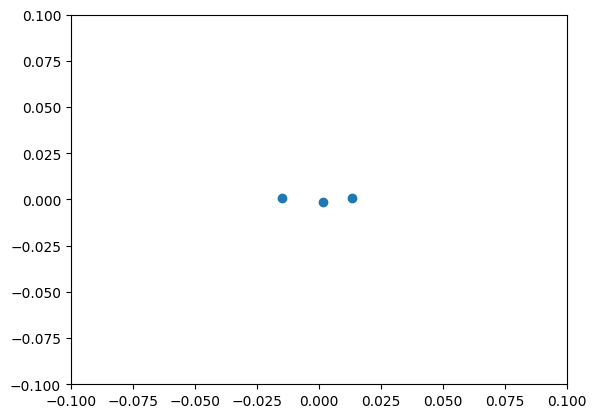

In [38]:
plt.scatter(t_points[:,0],t_points[:,2])
plt.xlim([-0.1,0.1])
plt.ylim([-0.1,0.1])

In [30]:
transformed_points = torch.matmul(pts_tor[::10], rot.float().T.cuda())

In [ ]:
#aligned along one axis. Need another axis to properly align

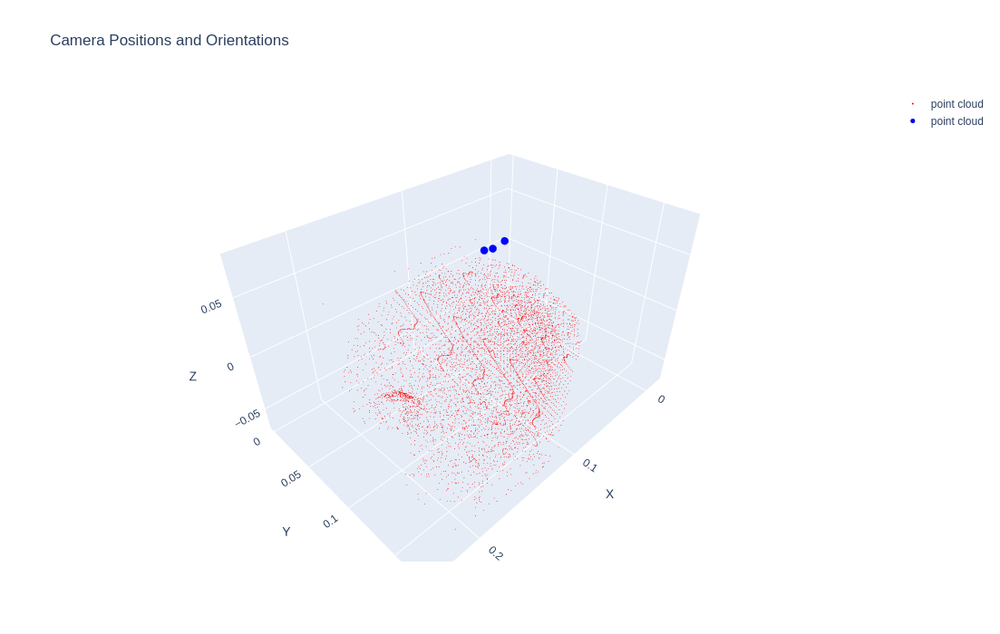

In [45]:
fig = go.Figure()


fig.add_trace(go.Scatter3d(x=transformed_points[::10, 0].detach().cpu(),  # X coordinates
    y=transformed_points[::10, 1].detach().cpu(),  # Y coordinates
    z=transformed_points[::10, 2].detach().cpu(),  # Z coordinates
                           mode='markers', marker=dict(size=0.5, color='red'),name="point cloud"))

fig.add_trace(go.Scatter3d(x=t_points[:, 0].detach().cpu(),  # X coordinates
    y=t_points[:, 1].detach().cpu(),  # Y coordinates
    z=t_points[:, 2].detach().cpu(),  # Z coordinates
                           mode='markers', marker=dict(size=5, color='blue'),name="point cloud"))

fig.update_layout(scene=dict(xaxis_title='X', yaxis_title='Y', zaxis_title='Z'),
                  title="Camera Positions and Orientations")

fig.update_layout(width=1000, height=700)
fig.show()